In [1]:
import os
import anndata
import sys
import numpy as np
wd = '/home/clarice/Documents/SingleCell_PseudoTime/'
os.chdir(wd)
sys.path.append('extras/Stabilized_ICA')

In [2]:
#-- Read data
sc200 = anndata.read_h5ad('data/sc200CL_pp.h5ad')

ref_cell_line = 'JHU011_UPPER_AERODIGESTIVE_TRACT'

## Preprocessing

In [3]:
import scycle as cc

cc.pp.prep_pooling(sc200)

Preparing embedding...
38919 samples pass the count filter
42362  samples pass the mt filter
Samples selected 38919


/home/clarice/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


Embedding for pooling...
Pooling 38919 samples...


/home/clarice/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


**On this warning:** Nothing I can do about it as of now, it's an internal error from anndata

In [4]:
cc.pp.score_cell_cycle(sc200)

-- Scoring G1 genes...


/home/clarice/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


-- Scoring S-phase...


/home/clarice/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


-- Scoring G2-M...


/home/clarice/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


-- Scoring Histones...
Found histone genes: H2AFZ H3F3B H3F3A H2AFV H2AFJ H2AFY H1FX H1F0 H2AFX H2AFY2
-- Scalling signatures...


## Integration

Here we run the first steps of the pipeline on the reference:

In [5]:
scref = sc200[sc200.obs['Cell_line'] == ref_cell_line]
cc.tl.dimensionality_reduction(scref, method = 'ica', n_comps = 30, seed = 0)
cc.tl.enrich_components(scref)

-- Dimensionality reduction using ICA...
-- Done
--- Selected components:
G1/S: 0
G2/M: 1
G2/M-: 5
Histones: 6


And here comes the OT integration implemented by Aziz:

In [6]:
cc.tl.integration(sc200, scref)

/home/clarice/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


## Finding the trajectory

In [7]:
cc.tl.principal_circle(sc200)

The initial number of nodes must be at least 3. This will be fixed
Generating the initial configuration
Creating a circle in the plane induced by the 1st and 2nd PCs with 3 nodes
90% of the points have been used as initial conditions. Resetting.
Constructing tree 1 of 1 / Subset 1 of 1
Performing PCA
Using standard PCA
4 dimensions are being used
100.0 % of the original variance has been retained
The elastic matrix is being used. Edge configuration will be ignored
Computing EPG with  30  nodes on  38919  points and  4  dimensions
BARCODE	ENERGY	NNODES	NEDGES	NRIBS	NSTARS	NRAYS	NRAYS2	MSE	MSEP	FVE	FVEP	UE	UR	URN	URN2	URSD

0||4	64365.8884	4	4	4	0	0	0	44695.7973	41557.6823	0.6623	0.686	3173.847	16496.244	65984.976	263939.9042	0
0||5	51640.5964	5	5	5	0	0	0	32993.6515	30232.4719	0.7507	0.7716	3852.6619	14794.283	73971.415	369857.0752	0
0||6	43083.3782	6	6	6	0	0	0	26415.2045	23694.5608	0.8004	0.821	4111.115	12557.0588	75342.3528	452054.1165	0
0||7	37126.6884	7	7	7	0	0	0	22146.2515	19202.264

/home/clarice/anaconda3/lib/python3.7/site-packages/plotnine/utils.py:1246: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


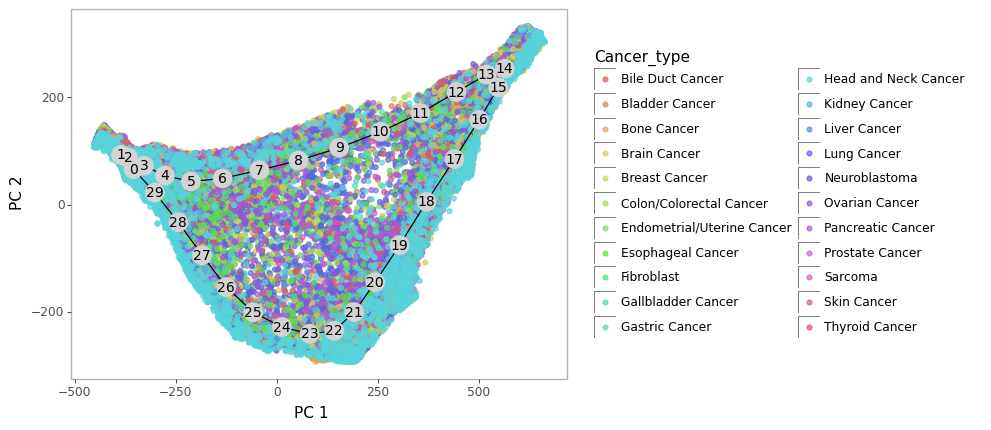

<ggplot: (8768636921069)>

In [8]:
cc.pl.scatter_projection(sc200, col_var = 'Cancer_type', trajectory = True)

In [9]:
cc.pl.scatter_projection3d(sc200, col_var = 'Cancer_type', alpha = 0.3,
                           trajectory = True, size = 3, node_color = 'black', palette = 'Accent')

## Find cell division moment

This is the clunkiest part of this pipeline, we may actually benefit from the alternative normalization based on the trajectory even if it was just to streamline this part.

Suggested moment of cell division: [16 17]
Direction of cell cycle: 1


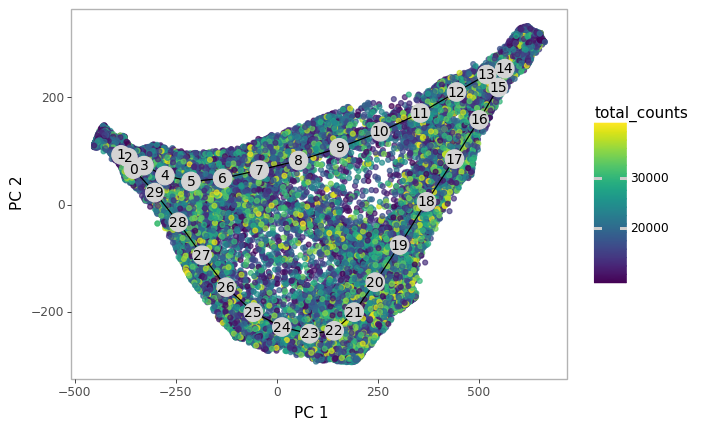

<ggplot: (8768955894765)>

In [10]:
cc.tl.celldiv_moment(sc200, var = 'total_counts')
cc.pl.scatter_projection(sc200, trajectory = True)


Total counts are kind of all over the place here. But there seems to be a bit of a gap around node 10?

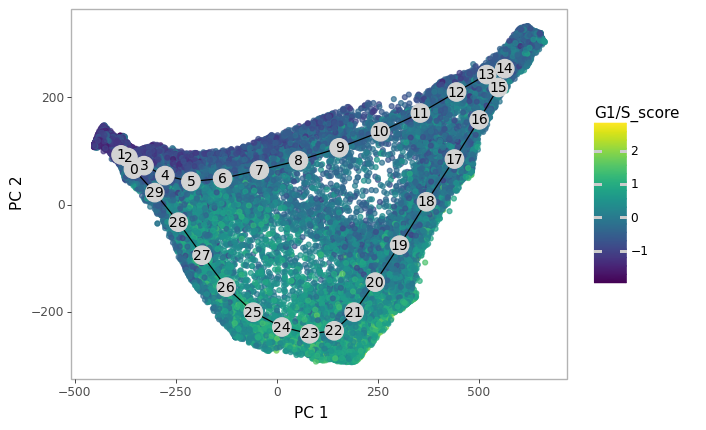

<ggplot: (8768918312665)>

In [11]:
cc.pl.scatter_projection(sc200, col_var = 'G1/S_score', trajectory = True)

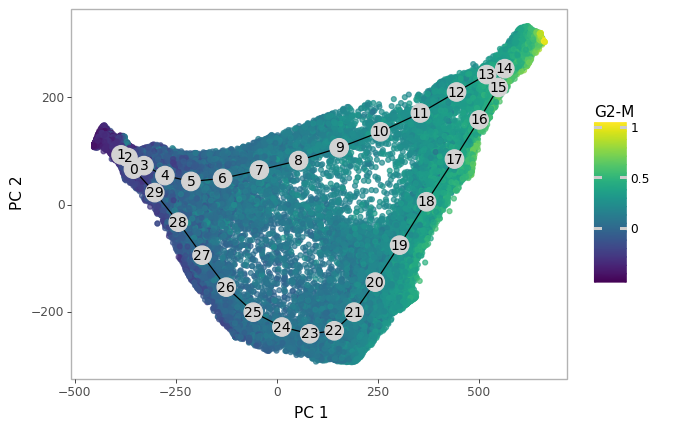

<ggplot: (8768918385137)>

In [12]:
cc.pl.scatter_projection(sc200, col_var = 'G2-M', trajectory = True)

In [13]:
cc.tl.remap_nodes(sc200, celldiv_edge = [10,11], cycle_direction = -1)


Remapping edges using [10, 11] ...


In [14]:
cc.tl.pseudotime(sc200)

Calculating pseudotimes for each cell...


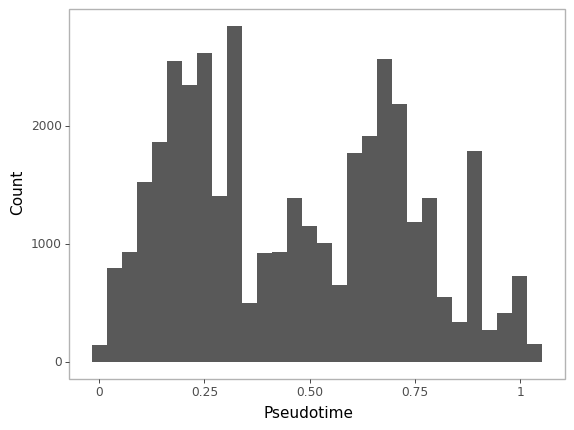

<ggplot: (8768912649845)>

In [15]:
cc.pl.hist_pseudotime(sc200)

/home/clarice/anaconda3/lib/python3.7/site-packages/plotnine/utils.py:1246: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



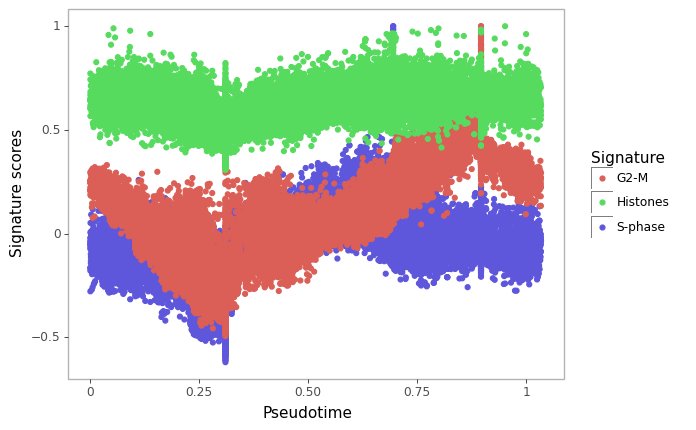

<ggplot: (8768913428749)>

In [16]:
cc.pl.scatter_cell_cycle(sc200)

/home/clarice/anaconda3/lib/python3.7/site-packages/plotnine/utils.py:1246: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



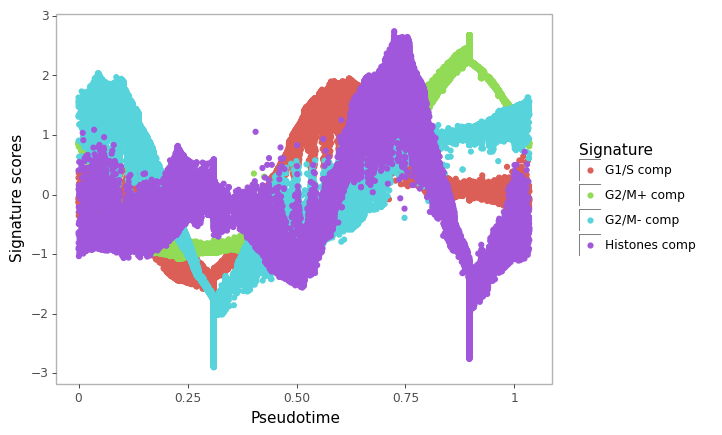

<ggplot: (8768912538889)>

In [17]:
cc.pl.scatter_cell_cycle(sc200, scores = 'components')

## Dividing the cell cycle

Of note, `cc.tl.cell_cycle_phase` already uses the curvature settings to find the cell cycle divisions.

In [18]:
cc.tl.cell_cycle_phase(sc200)

(30, 4)
-- Suggested cell cycle division:
G1:  0   - 0.3
S:  0.3 - 0.6666666666666666
G2: 0.6666666666666666 - 0.8666666666666667
M:  0.8666666666666667 -   1


/home/clarice/anaconda3/lib/python3.7/site-packages/plotnine/utils.py:1246: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/home/clarice/anaconda3/lib/python3.7/site-packages/plotnine/layer.py:464: PlotnineWarning:

geom_vline : Removed 1 rows containing missing values.



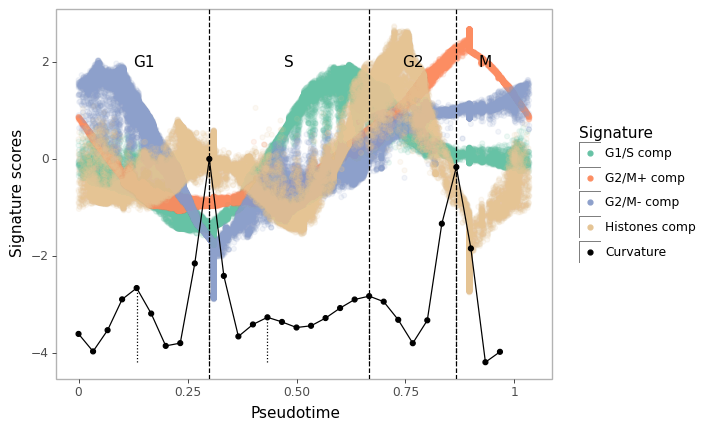

<ggplot: (8768918285437)>

In [19]:
cc.pl.scatter_cell_cycle(sc200, scores = 'components', alpha = 0.1)

In [20]:
cc.tl.annotate_cell_cycle(sc200)

/home/clarice/anaconda3/lib/python3.7/site-packages/plotnine/utils.py:1246: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



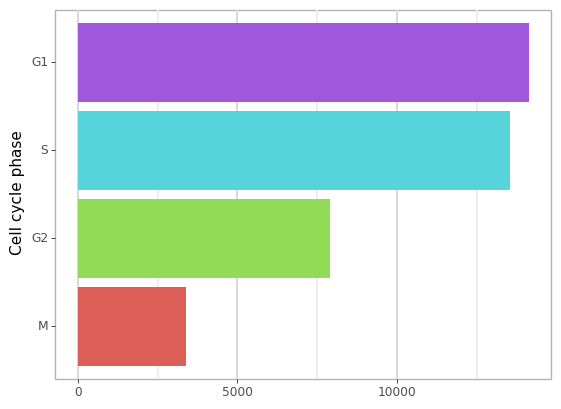

<ggplot: (8768918282237)>

In [21]:
cc.pl.barplot_cycle_phase(sc200)

Considering making this a piechart? I'd use our alternative plotting system with plotly for that since plotnine doesn't currently support polar coordinates, unfortunetely.

In [23]:
cc.pl.scatter_projection3d(sc200, col_var = 'cell_cycle_phase', size = 3)